<a href="https://colab.research.google.com/github/jaishruti/Influence-Maximization/blob/main/InfluenceMax(new).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import networkx as nx

#specifying path to edge list file
path_dataset = 'sample_data/Dataset2.txt'

#reading edge-list for graph formation
graph = nx.read_edgelist(path_dataset, create_using = nx.Graph(), nodetype=str)

num_of_nodes = graph.number_of_nodes()
count_edges = graph.number_of_edges()
#displaying graph info
print("Number of nodes: ", num_of_nodes)
print("Number of edges: ", count_edges)

#visualising graph
# nx.draw_networkx(graph)
#using list comphrehension
nodes = [node for node in graph.nodes()]

Number of nodes:  7624
Number of edges:  27806


In [ ]:
# Compute the betweenness centrality of nodes in the graph
betweenness = nx.betweenness_centrality(graph)
degreeCentrality = nx.degree_centrality(graph)
# Print the betweenness centrality of each node
# for node, centrality in betweenness.items():
#     print(f"Node {node}: {centrality}")

print("Betweeness centrality: ", betweenness)
print("Degree centrality: ", degreeCentrality)

Betweeness centrality:  {'0': 0.0, '747': 0.0003672774363444215, '1': 0.0023061399557024686, '4257': 0.0042099704285937225, '2194': 0.001318568250167888, '580': 0.0, '6478': 0.009596805345788419, '1222': 0.0035137762392582557, '5735': 0.0003494628506040224, '7146': 7.385226060965302e-05, '2204': 0.0009525810160413849, '126': 0.0008825590358086654, '2639': 0.0012551251948347635, '2': 7.169570839335663e-05, '562': 0.00023760693586995135, '1492': 1.6108365970256753e-05, '6': 0.002139799818418406, '5303': 0.0015870991390064262, '7128': 0.00042158238648855686, '4154': 0.00015300506234827206, '5179': 6.005007030194674e-06, '3': 0.0007096114518852534, '1728': 4.0272232260976365e-05, '4560': 0.0011519731512118297, '5060': 0.004168111234317579, '1351': 3.4808931407649435e-05, '6503': 6.733919454682841e-05, '7089': 0.0037355595950981325, '4319': 0.008315319517066736, '6095': 0.0012018292877394472, '272': 6.95894306653162e-05, '4433': 0.0008870420000775504, '2900': 0.0002672765190299345, '3381': 

In [ ]:
def diffusion_threshold_model(threshold, list_of_seed_nodes):
  #access all N seed list
  # threshold = 0.5
  c=0
  activation_fraction=[]
  for i in list_of_seed_nodes:
    c+=1
    print("\n-----Iter ",c,"-----")
    # print(num_of_nodes)
    state = [0]*num_of_nodes
    weighted_value = [threshold]*num_of_nodes

    #change state of seed nodes in i
    for n in i:
      state[int(n)] = 1
    print(state)

    #to track num of activated nodes 
    count_activated_nodes = state.count(1)
    prev_count_activated_nodes = 0

    #diffusion threshold model
    t=0
    while prev_count_activated_nodes !=  count_activated_nodes:
      t+=1
      # print("hi")
      # print("--------",t,"-------")

      prev_count_activated_nodes = count_activated_nodes

      for node in graph.nodes():

        #execute if state of node is 0
        if state[int(node)] != 1:
          count_active_neighbors = 0 
          count_neighbors = 0

          #count active neighbors

          for n in graph.neighbors(node):
            if state[int(n)] == 1:
              count_active_neighbors += 1
            count_neighbors += 1
          
          #calculate weighted value
          weighted_value[int(node)] = count_active_neighbors / count_neighbors
          # print(f'weighted value of {node}: {weighted_value[int(node)]}')

          if weighted_value[int(node)] >= threshold:
            state[int(node)] = 1

      count_activated_nodes = state.count(1)  
      # print("State list: ",state)
      # print("count activated nodes: ", count_activated_nodes)
    af = state.count(1) / num_of_nodes
    activation_fraction.append(af)
    print("Activation fraction: ",af)  
    
  #call plot function
  return(activation_fraction)

In [ ]:
#print activation fraction matrix
def display(af):
  print("10 x 5 af list: ")
  for x, y in af.items():
    print(x,y)

In [ ]:
import random
num_of_nodes = graph.number_of_nodes()
# print("Total nodes: ", num_of_nodes)

#s
# seed_percent = 0.10
# seed_set_size = round(seed_percent * num_of_nodes)
# print("Seed set size: ", seed_set_size)

#repeat the seed set formation N times


def OneHop(high_degree, between_cent, seed_size):
  # size_of_random_nodes_for_seed_selection
  random_nodes_size = round(percent_of_random_nodes * num_of_nodes)
  print("random_nodes_size: ", random_nodes_size)
  
  list_of_seed_nodes = []

  for i in range(N):

    print("\n----------Iteration ", i,"--------------")
    list_of_neighbor = []
    #randomly select 15% of nodes
    random_nodes = random.sample(nodes, random_nodes_size)

    print(random_nodes)
    
    #selcting random one neighbour of each node in Random_nodes(R)
    selected_neigh = []
    for j in random_nodes:
      l=[]
      for n in graph.neighbors(str(j)):
        l.append(n)
      
      #neighbors of j
      # print("neighbours of ", j, ": ", l  )
      
      #select randomly 1 neighbor of j 
      
      random_neighbor = random.choice(l)
      k=len(l)
      while k != 0 and random_neighbor in selected_neigh:
        random_neighbor = random.choice(l)
        k-=1
      selected_neigh.append(random_neighbor)

      #add it to list of neighbors
      list_of_neighbor.append(random_neighbor)

    # print("list of selected 1 random neighbor: ", list_of_neighbor,"\n")

    #degree centrality of selected neighbors
    # dict->key(node), value(degree)
    dict_nodes = {}
    for k in list_of_neighbor:
      if between_cent == 1:
        dict_nodes[k] = betweenness[k]
      if high_degree == 1:
        dict_nodes[k] = degreeCentrality[k]
    # print("Neighbor nodes with their degree: ", dict_nodes)

    #get s highest degree nodes from neighbours
    # Sort the dictionary by value in descending order
    sorted_dict = sorted(dict_nodes.items(), key=lambda x: x[1], reverse=True)

    
      # Extract the top k elements using slicing
    top_k = sorted_dict[:seed_size]
      # print("Seed set ", i,": ", top_k)

    
      #seed set 
    seed_set = []
    for k in top_k:
      seed_set.append(k[0])
    print("seed_set: ", seed_set)
    list_of_seed_nodes.append(seed_set)

  print(list_of_seed_nodes)
    #get activation fraction of diffusion
  af = diffusion_threshold_model(threshold, list_of_seed_nodes)
  # activation_fraction_matrix[seed_size] = af
    


    #add it to matrix Nxs
  # return activation_fraction_matrix
  return af


In [ ]:
#find max of every iteration
def find_max(a):
  max_af=[0]*(seed_size)
  print(a)
  for item,listtt in a.items():
    max = 0
    for i in listtt:
      if max < i:
        max = i
    max_af[item-1] = max
  print(max_af)
  return max_af



In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# threshold = 0.8
def plotting_graph(max_af_hd, max_af_bc):
  x = np.arange(1, seed_size+1)
  y = np.array(max_af_hd)
  z = np.array(max_af_bc)

  plt.plot(x,y,label="OneHopHD")
  plt.plot(x,z,label="OneHopBC")

  plt.title(f"Rate of activation: threshold:{threshold}")
  plt.xlabel(f"Seed set size")
  plt.ylabel("Activation fraction ")
  plt.legend()
  plt.show()




---------------------------------------------------FOR OneHopHD:----------------------------------------------------------------------
random_nodes_size:  2287

----------Iteration  0 --------------
['1138', '2876', '6144', '1521', '5614', '756', '7288', '903', '7122', '2012', '2137', '6724', '5904', '835', '5894', '3139', '5341', '3382', '4945', '228', '3351', '2692', '4583', '5184', '4834', '6932', '2136', '2940', '5190', '4676', '1038', '4332', '2594', '4648', '4121', '2533', '5484', '4465', '7127', '88', '2214', '1268', '292', '5017', '5405', '6622', '117', '5036', '1153', '289', '7178', '2383', '277', '4990', '4501', '3007', '4355', '7225', '3279', '6308', '2654', '4732', '3506', '3111', '898', '80', '1332', '2183', '6616', '5209', '3534', '2897', '36', '503', '4699', '5611', '6765', '2425', '3172', '4231', '4634', '63', '995', '1094', '560', '3340', '2321', '6906', '6004', '7542', '6221', '5671', '1370', '360', '6910', '102', '208', '6368', '5584', '4027', '1539', '3415', '6928'

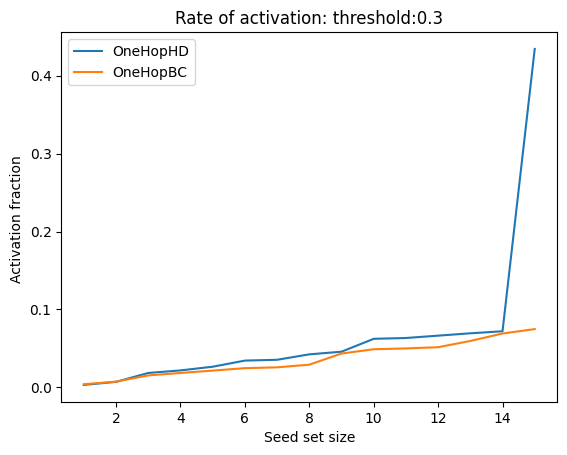

In [ ]:
N = 10

percent_of_random_nodes = 0.30
activation_fraction_matrix = {}
threshold = 0.6

seed_size = 5
af_matrix_hd = {}
print("\n---------------------------------------------------FOR OneHopHD:----------------------------------------------------------------------")
for i in range(1,seed_size+1):
  af_matrix_hd[i] = OneHop(1,0,i)

for key,val in af_matrix_hd.items():
  print(f"{key} : {val}")

af_matrix_bc = {}
print("\n---------------------------------------------------FOR OneHopBC:----------------------------------------------------------------------")
for i in range(1,seed_size+1):
  af_matrix_bc[i] = OneHop(0,1,i)

for key,val in af_matrix_bc.items():
  print(f"{key} : {val}")

print("\nOneHop HD max af for different seed set size: ")
max_af_hd = find_max(af_matrix_hd)
print("OneHop BC max af for different seed set size: ")
max_af_bc = find_max(af_matrix_bc)

plotting_graph(max_af_hd, max_af_bc)